In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import warnings
from tqdm.notebook import tqdm
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import load_img, array_to_img
from tensorflow.keras.models import Sequential , Model
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy

warnings.filterwarnings('ignore')

2024-05-11 12:43:09.835901: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-11 12:43:09.835989: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-11 12:43:09.971492: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
BASE_DIR = '/kaggle/input/anime-faces/data/'

In [3]:
#Load all the complete image path
image_paths = []
for image_name in os.listdir(BASE_DIR):
    image_path = os.path.join(BASE_DIR , image_name)
    image_paths.append(image_path)
    

In [4]:
image_paths[:5]

['/kaggle/input/anime-faces/data/21130.png',
 '/kaggle/input/anime-faces/data/9273.png',
 '/kaggle/input/anime-faces/data/18966.png',
 '/kaggle/input/anime-faces/data/14127.png',
 '/kaggle/input/anime-faces/data/18054.png']

In [5]:
print("size of image Paths list : ",len(image_paths))

size of image Paths list :  21552


In [6]:
image_paths.remove('/kaggle/input/anime-faces/data/data')

In [7]:
#remove unnecessary file
print("size of image Paths list : ",len(image_paths))

size of image Paths list :  21551


## Visualize the image data set

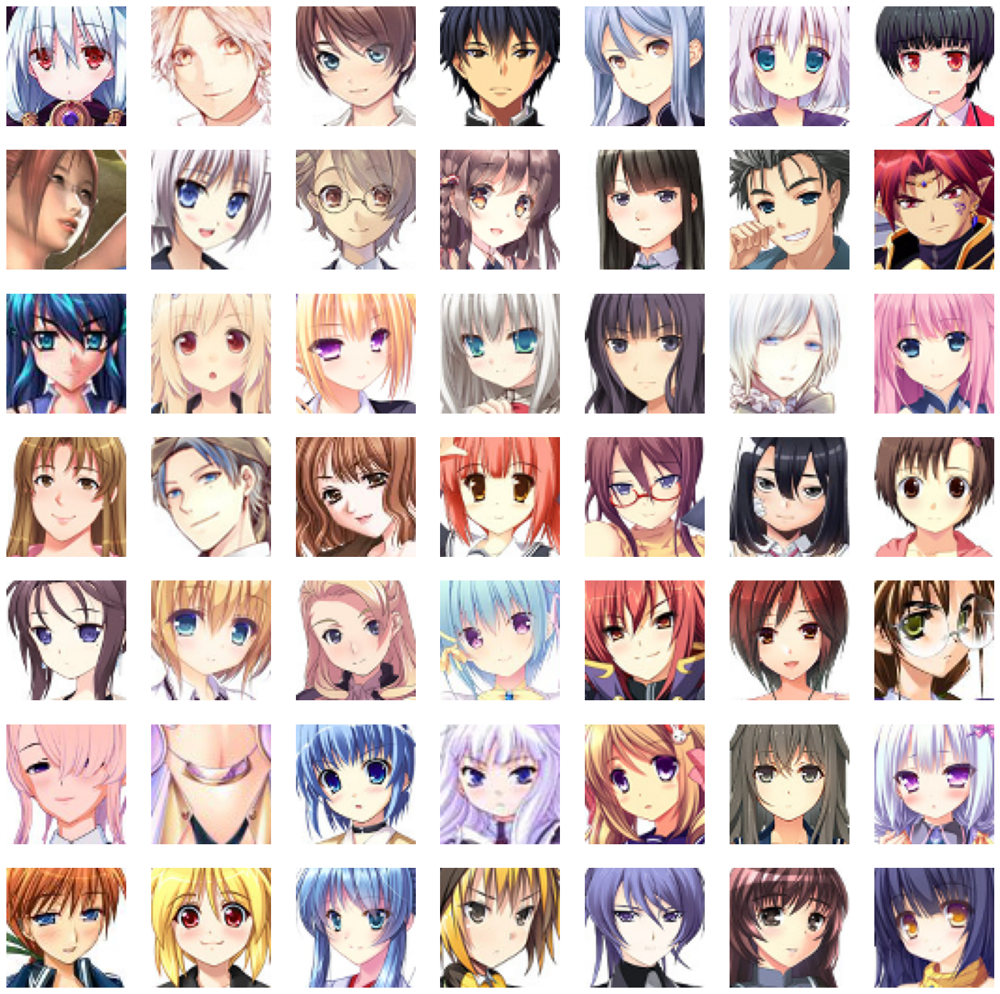

In [8]:
#to display grid of images (7 * 7)
plt.figure(figsize = (20 ,20))
temp_images = image_paths[:49]
index = 1

for image_path in temp_images:
    plt.subplot(7 ,7 , index)
    #load the image
    img = load_img(image_path)
    #convert to numpy array
    img = np.array(img)
    #show image
    plt.imshow(img)
    plt.axis('off')
    #increment the image
    index += 1

## PreProcess Images

In [9]:
#load image and convert to numpy array
train_images = [np.array(load_img(path)) for path in tqdm(image_paths)]
train_images = np.array(train_images) 

  0%|          | 0/21551 [00:00<?, ?it/s]

In [10]:
print("Checking shape of the array ",train_images[0].shape)

Checking shape of the array  (64, 64, 3)


In [11]:
#reshape the array
train_images = train_images.reshape(train_images.shape[0] , 64 ,64 ,3).astype('float32')

In [12]:
#normalize images converting in range of -1 to 1
train_images = (train_images - 127.5) / 127.5

In [13]:
train_images[0]

array([[[-0.7254902 , -0.90588236, -0.7176471 ],
        [-0.70980394, -0.88235295, -0.6862745 ],
        [-0.7019608 , -1.        , -0.7176471 ],
        ...,
        [-0.09019608,  0.01176471,  0.3882353 ],
        [-0.19215687,  0.05882353,  0.4509804 ],
        [-0.34117648, -0.13725491,  0.29411766]],

       [[-0.7254902 , -0.90588236, -0.7176471 ],
        [-0.73333335, -0.8666667 , -0.7019608 ],
        [-0.52156866, -0.8666667 , -0.5686275 ],
        ...,
        [-0.29411766,  0.01176471,  0.3019608 ],
        [-0.08235294,  0.15294118,  0.5294118 ],
        [-0.23921569,  0.09019608,  0.45882353]],

       [[-0.7019608 , -0.8901961 , -0.7019608 ],
        [-0.7176471 , -0.8745098 , -0.69411767],
        [-0.5686275 , -0.8509804 , -0.58431375],
        ...,
        [-0.22352941,  0.1764706 ,  0.48235294],
        [-0.13725491,  0.1764706 ,  0.4745098 ],
        [-0.06666667,  0.24705882,  0.5058824 ]],

       ...,

       [[-0.30980393, -0.6862745 , -0.29411766],
        [-0

## Create Genrator and discriminator Models

In [14]:
#latent dimension for random noise
LATENT_DIM = 100
#weight initalizer
WEIGHT_INIT = keras.initializers.RandomNormal(mean=0.0 ,stddev = 0.02)
#Number of channels of the image
CHANNELS = 3 

## Create Generator Model 

In [53]:
model = Sequential(name = 'generator')
#1d random noise
model.add(layers.Dense(8 * 8 * 512 , input_dim = (LATENT_DIM)))
# model.add(layers.BatchNormalization())
model.add(layers.ReLU())

# convert 1d to 3d
model.add(layers.Reshape((8 , 8, 512)))

#upsample to 16X16
model.add(layers.Conv2DTranspose(256 , (4 , 4) , strides = (2 , 2) , padding = 'same' , kernel_initializer = WEIGHT_INIT))
# model.add(layers.BatchNormalization())
model.add(layers.ReLU())

#upsample to 32X32
model.add(layers.Conv2DTranspose(128 , (4 , 4) , strides = (2 , 2) , padding = 'same' , kernel_initializer = WEIGHT_INIT))
# model.add(layers.BatchNormalization())
model.add(layers.ReLU())

#upsample to 64X64
model.add(layers.Conv2DTranspose(64 , (4 , 4) , strides = (2 , 2) , padding = 'same' , kernel_initializer = WEIGHT_INIT))
# model.add(layers.BatchNormalization())
model.add(layers.ReLU())

model.add(layers.Conv2D(CHANNELS , (4 , 4), padding = 'same' , activation = 'tanh'))

generator = model
generator.summary()

Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2 (Dense)                 │ (None, 32768)          │     3,309,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_4 (ReLU)                  │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_1 (Reshape)             │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_3              │ (None, 16, 16, 256)    │     2,097,408 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_5 (ReLU)                  │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_4              │ (None, 32, 32, 128)    │       524,416 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_6 (ReLU)                  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_5              │ (None, 64, 64, 64)     │       131,136 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_7 (ReLU)                  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 64, 64, 3)      │         3,075 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,065,603 (23.14 MB)

 Trainable params: 6,065,603 (23.14 MB)

 Non-trainable params: 0 (0.00 B)

## Discriminator Model

In [54]:
model = Sequential(name = 'discriminator')
input_shape = (64 , 64 , 3)
alpha = 0.2

#create conv layers
model.add(layers.Conv2D(64 , (4 , 4) , strides = (2 , 2) ,padding = 'same' , input_shape = input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha = alpha))

model.add(layers.Conv2D(128 , (4 , 4) , strides = (2 , 2) ,padding = 'same' , input_shape = input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha = alpha))

model.add(layers.Conv2D(128 , (4 , 4) , strides = (2 , 2) ,padding = 'same' , input_shape = input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha = alpha))

model.add(layers.Flatten())
model.add(layers.Dropout(0.3))

#output class
model.add(layers.Dense(1 , activation = 'sigmoid'))

discriminator = model
discriminator.summary()

Model: "discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)               │ (None, 32, 32, 64)     │         3,136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 16, 16, 128)    │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_4 (LeakyReLU)       │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 8, 8, 128)      │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 8, 8, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_5 (LeakyReLU)       │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │         8,193 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 406,081 (1.55 MB)

 Trainable params: 405,441 (1.55 MB)

 Non-trainable params: 640 (2.50 KB)

## Create DCGAN

In [55]:
class DCGAN(keras.Model):
    def __init__(self , generator , discriminator , latent_dim):
        super().__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.latent_dim = latent_dim
        self.g_loss_metric = keras.metrics.Mean(name = 'g_loss')
        self.d_loss_metric = keras.metrics.Mean(name = 'd_loss')
    
    @property
    def metrics(self):
        return [self.g_loss_metric , self.d_loss_metric]
    
    def compile(self , g_otimizer , d_optimizer , loss_fn):
        super(DCGAN , self).compile()
        self.g_otimizer = g_otimizer
        self.d_optimizer = d_optimizer
        self.loss_fn = loss_fn
        
    def train_step(self , real_images):
        #get batch size from the data
        batch_size = tf.shape(real_images)[0]
        #generate random noise
        random_noise = tf.random.normal(shape = (batch_size , self.latent_dim))
        
        #train the discriminator with real->1 and fake->0 images
        with tf.GradientTape() as tape:
            #compute loss on real image
            pred_real = self.discriminator(real_images , training = True)
            #generat real image labels
            real_labels = tf.ones((batch_size , 1))
            real_labels += 0.05 * tf.random.uniform(tf.shape(real_labels))
            d_loss_real = self.loss_fn(real_labels , pred_real)
            
            #compute loss on fake images
            
            fake_images = self.generator(random_noise)
            pred_fake = self.discriminator(fake_images ,training = True)
            #genrate fake label
            fake_labels = tf.zeros((batch_size , 1))
            d_loss_fake = self.loss_fn(fake_labels , pred_fake)
            
            #total discriminator loss
            d_loss = (d_loss_real + d_loss_fake) / 2
            
        
        #compute discriminator gradients
        gradients = tape.gradient(d_loss , self.discriminator.trainable_variables)
        #update the gradients
        self.d_optimizer.apply_gradients(zip(gradients , self.discriminator.trainable_variables))
        
        #train generator model
        
        labels = tf.ones((batch_size , 1))
        #generator wants disciminator to think fake images are real
        with tf.GradientTape() as tape:
            fake_images = self.generator(random_noise , training = True)
            pred_fake = self.discriminator(fake_images , training = True)
            
            #compute loss
            g_loss = self.loss_fn(labels , pred_fake)
            
        #compute gradients
        gradients = tape.gradient(g_loss , self.generator.trainable_variables)
        self.g_otimizer.apply_gradients(zip(gradients , self.generator.trainable_variables))
        
        #update states for both models
        self.d_loss_metric.update_state(d_loss)
        self.d_loss_metric.update_state(g_loss)
        
        return {'d_loss' : self.d_loss_metric.result() , 'g_loss' : self.g_loss_metric.result()}

In [56]:
class DCGANMonitor(keras.callbacks.Callback):
    def __init__(self , num_imgs = 25 , latent_dim = 100):
        self.num_imgs = num_imgs
        self.latent_dim = latent_dim
        
        #create random noise for genrating images
        self.noise = tf.random.normal([25,latent_dim])
        
    def on_epoch_end(self , epoch , logs = None):
        g_img = self.model.generator(self.noise)
        g_img = (g_img * 127.5) + 127.5
        g_img.numpy()
        
        fig = plt.figure(figsize = (8, 8))
        for i in range(self.num_imgs):
            plt.subplot(5 , 5 ,i+1)
            img = array_to_img(g_img[i])
            plt.imshow(img)
            plt.axis('off')
            
        plt.show()
        
    def on_train_end(self , logs = None):
        self.model.generator.save('generator.h5')
        

In [57]:
dcgan = DCGAN(generator , discriminator, latent_dim = LATENT_DIM)

In [58]:
D_LR = 0.0001
G_LR = 0.0003
dcgan.compile(g_otimizer = Adam(learning_rate = G_LR , beta_1 = 0.5) , d_optimizer = Adam(learning_rate = D_LR , beta_1 = 0.5) , loss_fn = BinaryCrossentropy())

Epoch 1/50
  5/674 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - d_loss: 0.9693 - g_loss: 0.0000e+00 

W0000 00:00:1715432993.428622     322 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


674/674 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - d_loss: 1.5697 - g_loss: 0.0000e+00

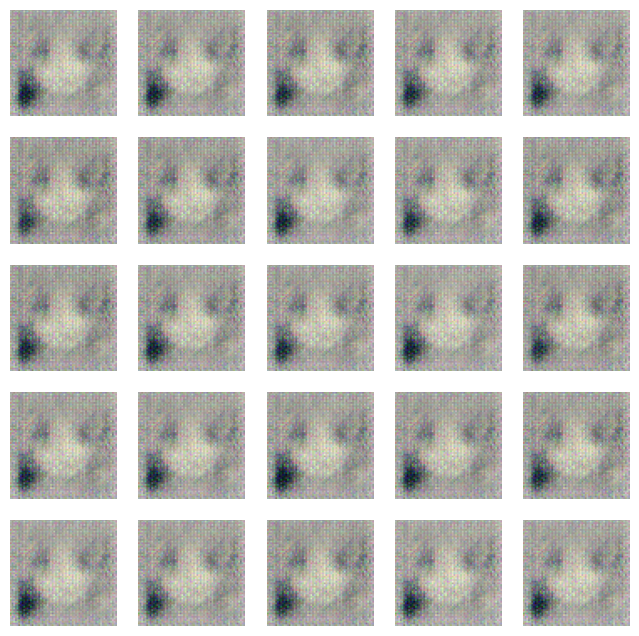

674/674 ━━━━━━━━━━━━━━━━━━━━ 46s 48ms/step - d_loss: 1.5699 - g_loss: 0.0000e+00
Epoch 2/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - d_loss: 1.3029 - g_loss: 0.0000e+00

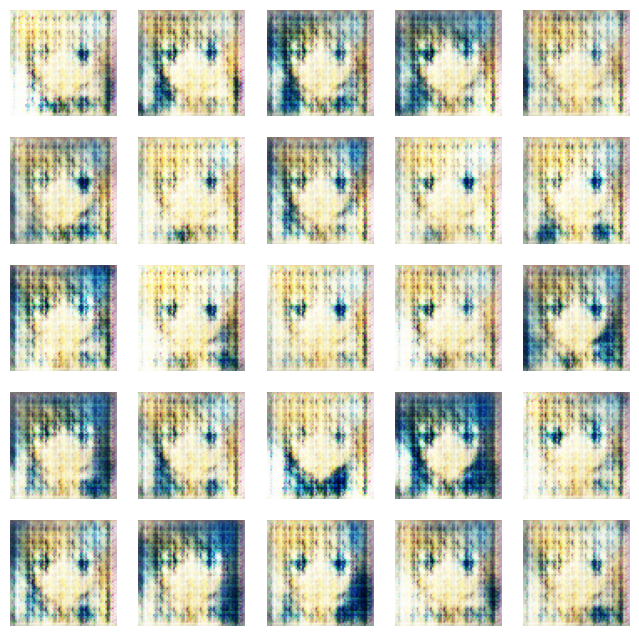

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - d_loss: 1.3025 - g_loss: 0.0000e+00
Epoch 3/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - d_loss: 1.1966 - g_loss: 0.0000e+00

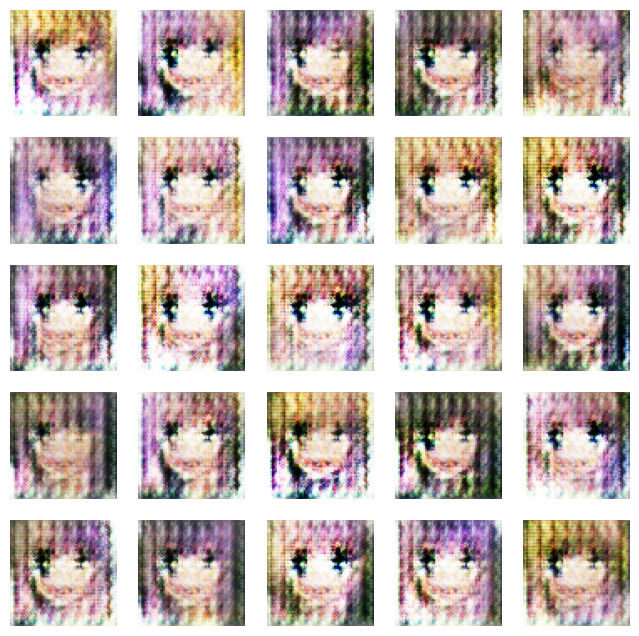

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - d_loss: 1.1966 - g_loss: 0.0000e+00
Epoch 4/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - d_loss: 1.2241 - g_loss: 0.0000e+00

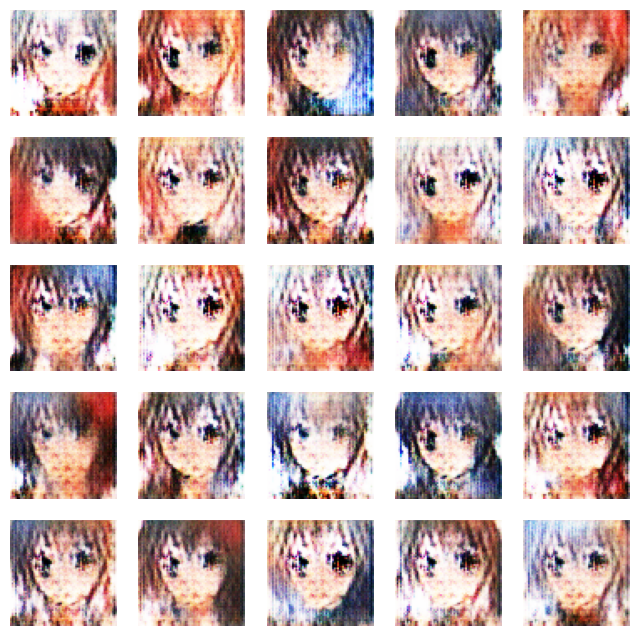

674/674 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - d_loss: 1.2241 - g_loss: 0.0000e+00
Epoch 5/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - d_loss: 1.1571 - g_loss: 0.0000e+00

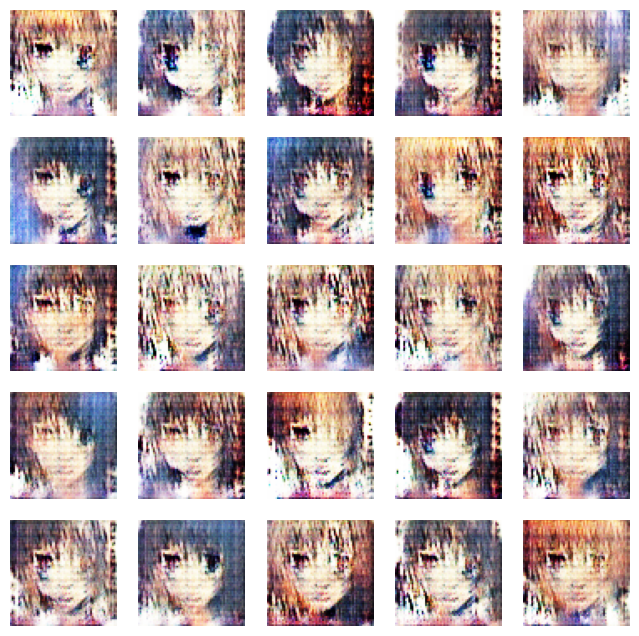

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - d_loss: 1.1571 - g_loss: 0.0000e+00
Epoch 6/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - d_loss: 1.1734 - g_loss: 0.0000e+00

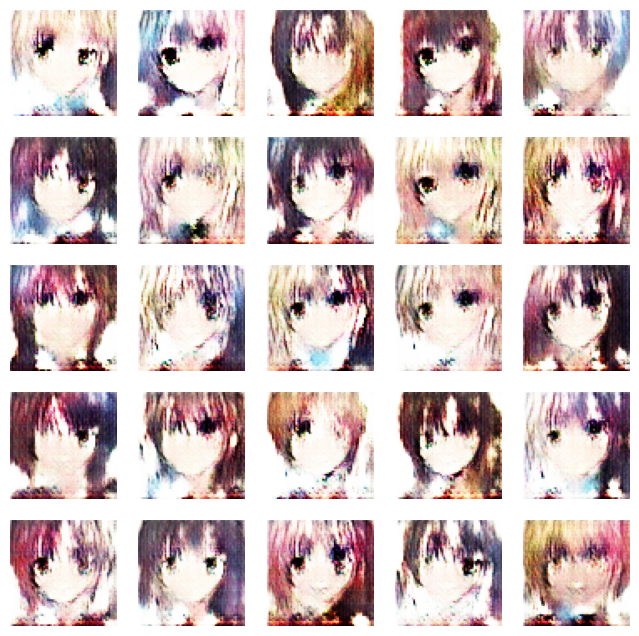

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - d_loss: 1.1734 - g_loss: 0.0000e+00
Epoch 7/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - d_loss: 1.0956 - g_loss: 0.0000e+00

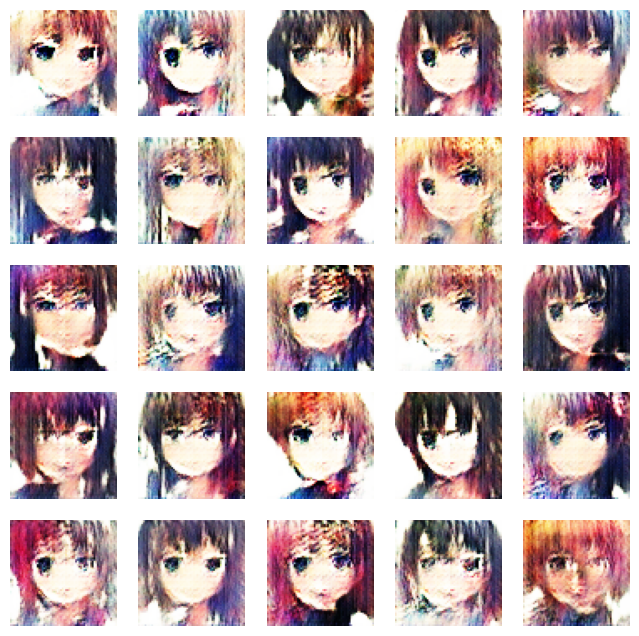

674/674 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - d_loss: 1.0955 - g_loss: 0.0000e+00
Epoch 8/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 1.0774 - g_loss: 0.0000e+00

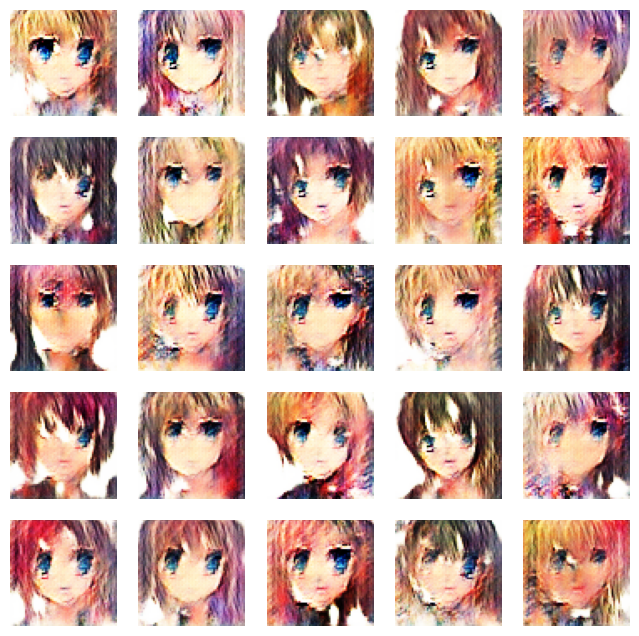

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - d_loss: 1.0774 - g_loss: 0.0000e+00
Epoch 9/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - d_loss: 1.0593 - g_loss: 0.0000e+00

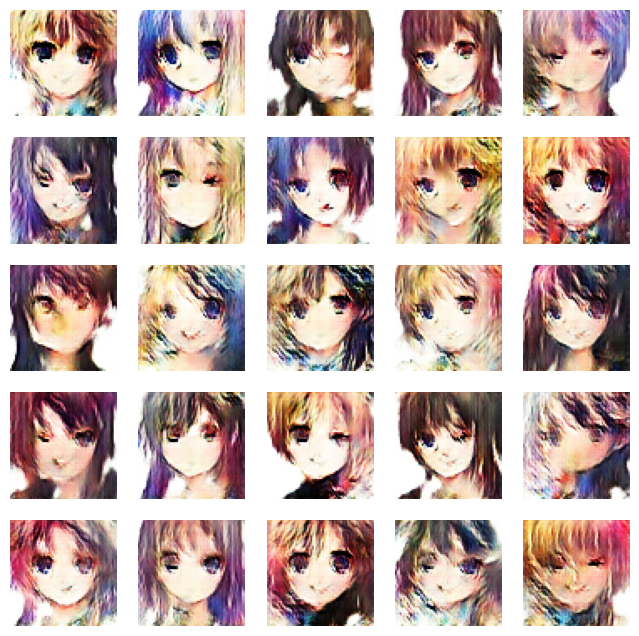

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - d_loss: 1.0593 - g_loss: 0.0000e+00
Epoch 10/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - d_loss: 0.9690 - g_loss: 0.0000e+00

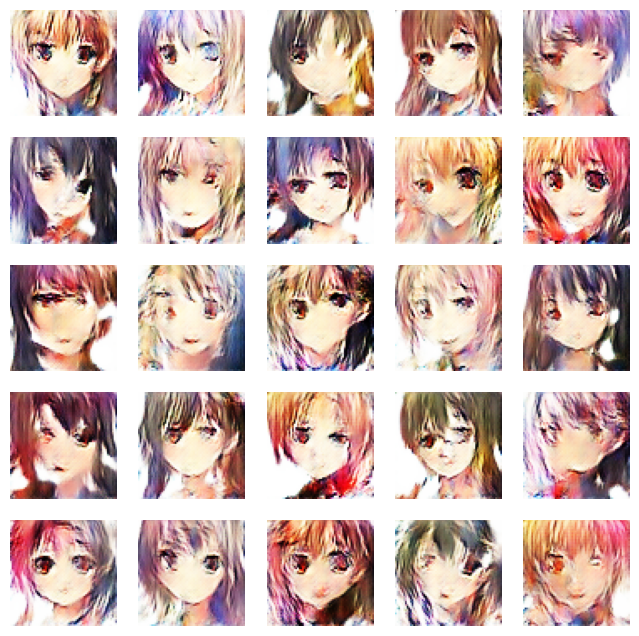

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - d_loss: 0.9689 - g_loss: 0.0000e+00
Epoch 11/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - d_loss: 0.9009 - g_loss: 0.0000e+00

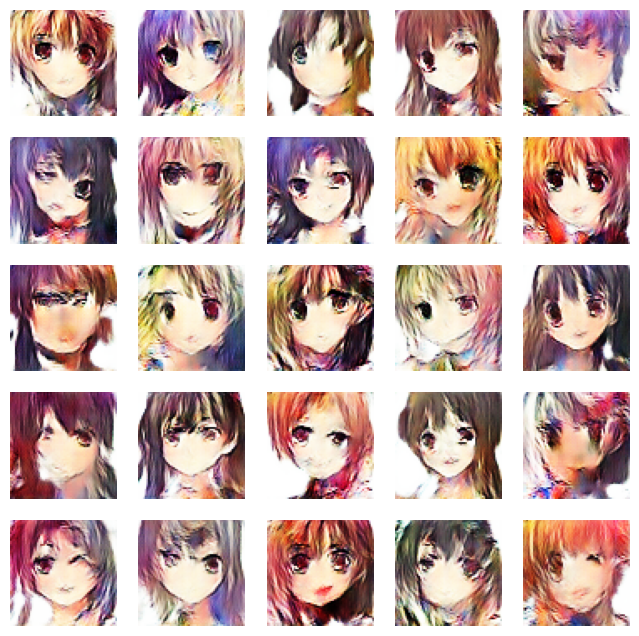

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - d_loss: 0.9009 - g_loss: 0.0000e+00
Epoch 12/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - d_loss: 0.8603 - g_loss: 0.0000e+00

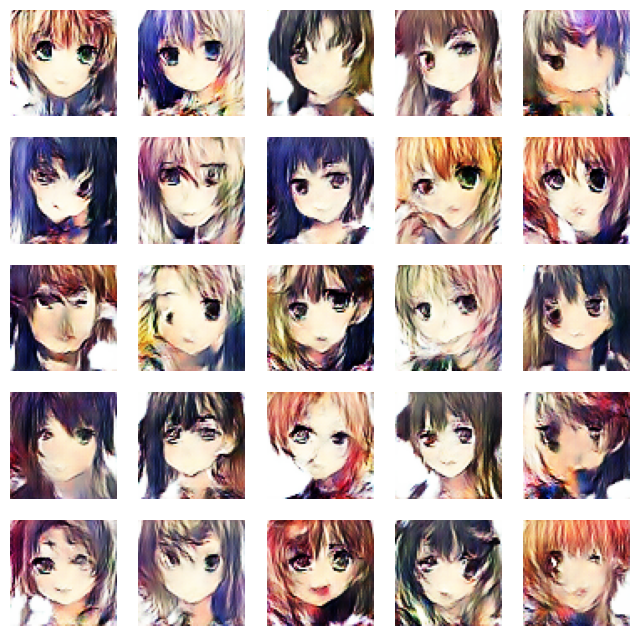

674/674 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - d_loss: 0.8603 - g_loss: 0.0000e+00
Epoch 13/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - d_loss: 0.8414 - g_loss: 0.0000e+00

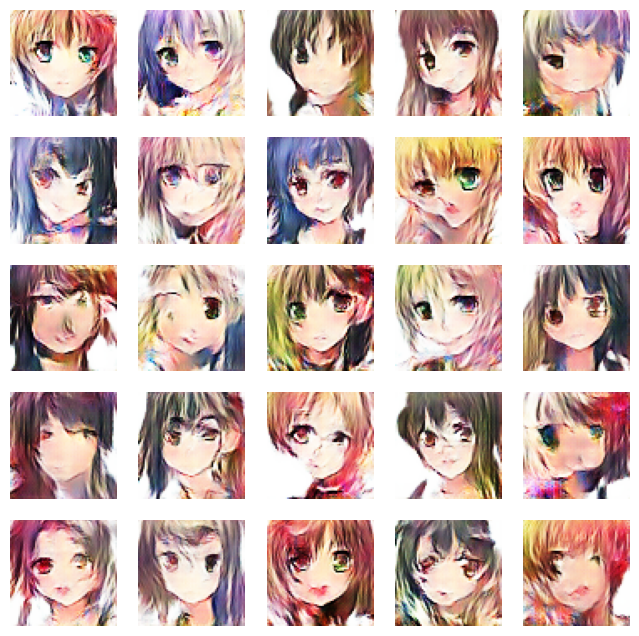

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - d_loss: 0.8414 - g_loss: 0.0000e+00
Epoch 14/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.8092 - g_loss: 0.0000e+00

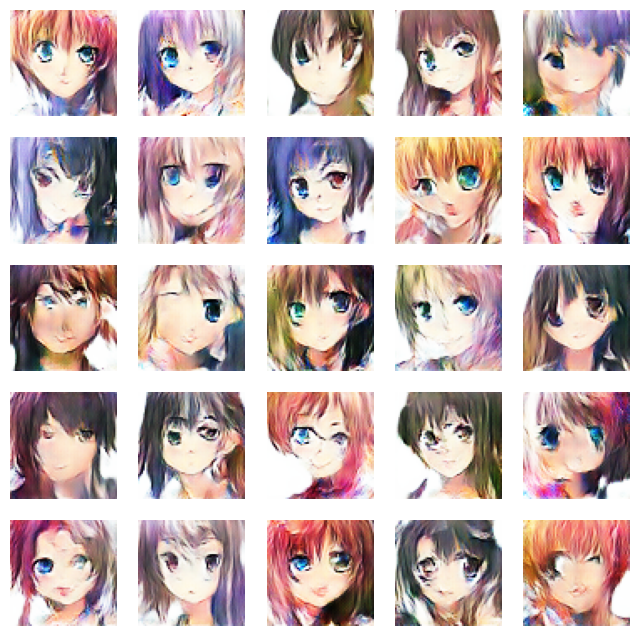

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - d_loss: 0.8092 - g_loss: 0.0000e+00
Epoch 15/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - d_loss: 0.7904 - g_loss: 0.0000e+00

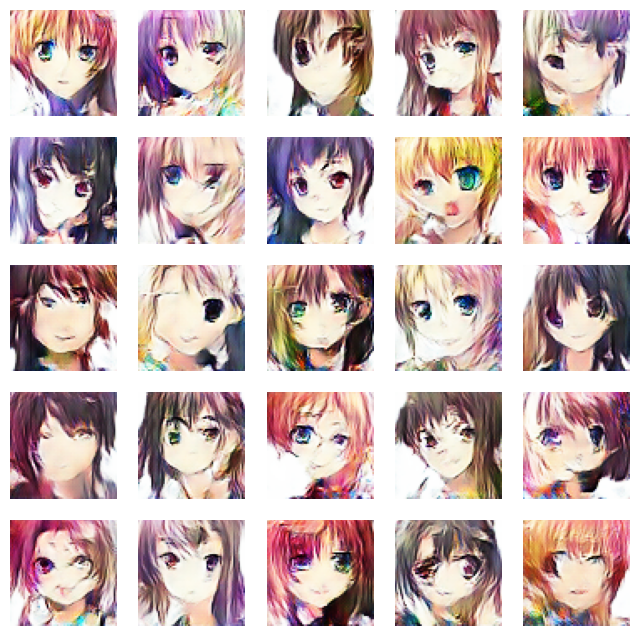

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - d_loss: 0.7904 - g_loss: 0.0000e+00
Epoch 16/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - d_loss: 0.7823 - g_loss: 0.0000e+00

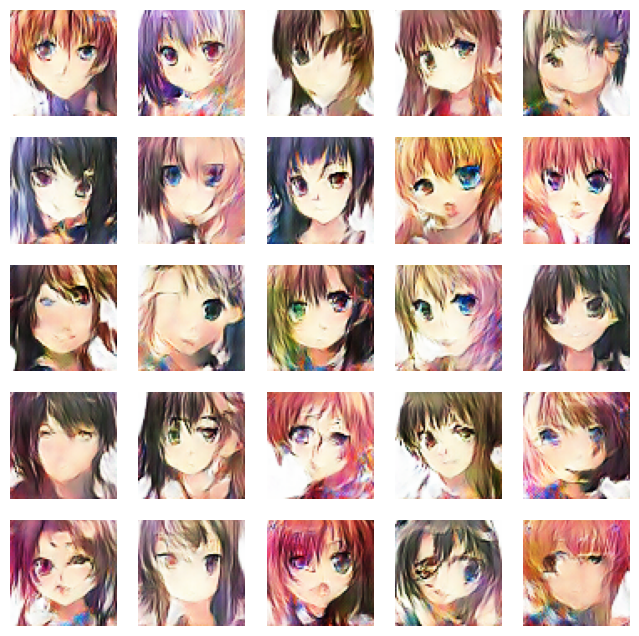

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - d_loss: 0.7823 - g_loss: 0.0000e+00
Epoch 17/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.7749 - g_loss: 0.0000e+00

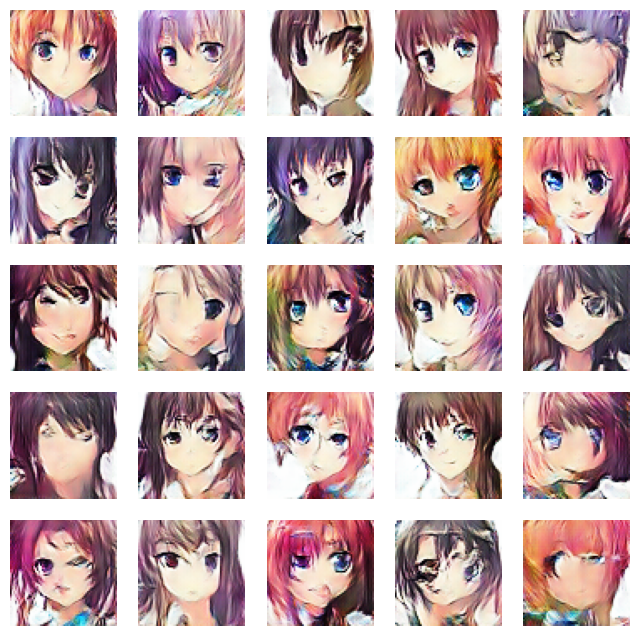

674/674 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - d_loss: 0.7749 - g_loss: 0.0000e+00
Epoch 18/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - d_loss: 0.7727 - g_loss: 0.0000e+00

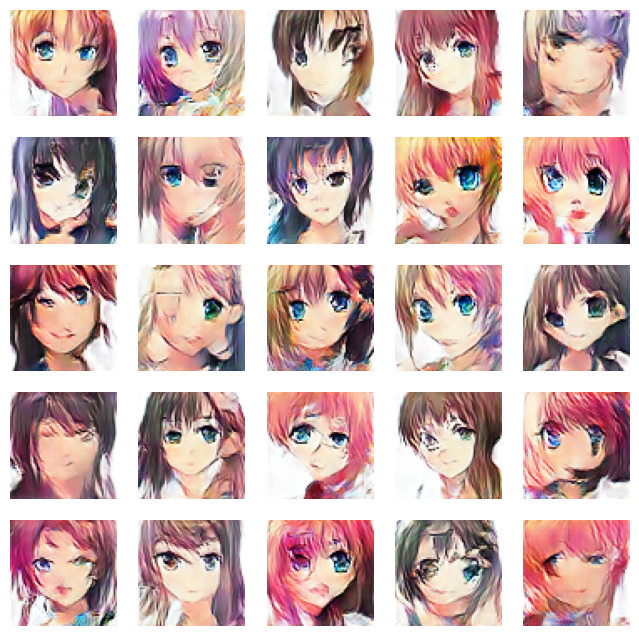

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - d_loss: 0.7727 - g_loss: 0.0000e+00
Epoch 19/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - d_loss: 0.7607 - g_loss: 0.0000e+00

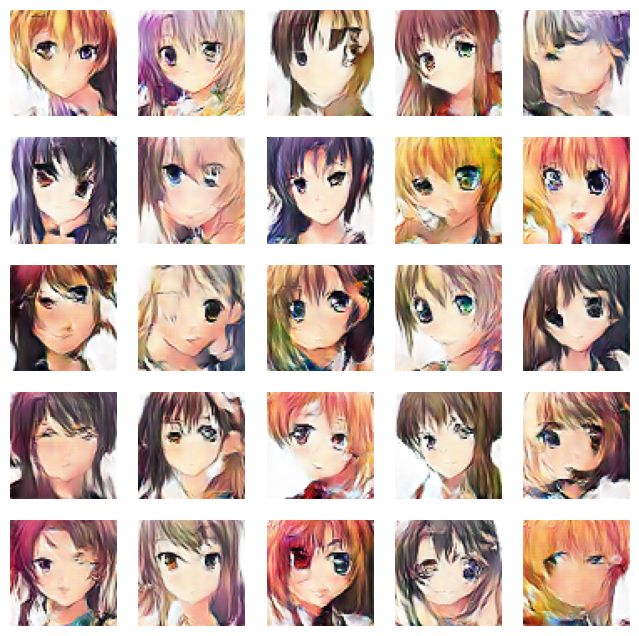

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - d_loss: 0.7607 - g_loss: 0.0000e+00
Epoch 20/50
167/674 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - d_loss: 0.7527 - g_loss: 0.0000e+00

In [ ]:
N_Epochs = 50
dcgan.fit(train_images , epochs = N_Epochs , callbacks = [DCGANMonitor()])